In [230]:
### Mini-projekt I - **Chmura słów**
## Zuzanna Piekarczyk (141771)

# Przygotuj chmurę słów (lub wykres kolumnowy dla 50 najczęściej używanych słów) w oparciu o *bag-of-words*. Dla pozyskanych przez Ciebie dokumentów (w języku angielskim). Korpus ma odzwierciedlać pewną dychotomię - konflikt, dyskusję dwóch stron pewnego zjawiska np: zmian klimatycznych, lockdownu, ulubionego sportu (rugby vs. piłka nożna). Mogą to być: teksty tweetów na wybrane tematy (min 1000 tweetów dla każdej strony); dwóch grup artykułów (po 3-5 dla każdej strony, każdy ponad 2000 wyrazów); wypowiedzi dwóch ekspertów czy polityków (po 3-5 dla każdej strony, każdy ponad 2000 wyrazów).

# Analizę wykonaj w dwóch wersjach:

# a) dwa teksty traktowane są osobno - jako dwa osobne korpusy, przygotuj dwie wizualizacje dla każdej strony osobno.
# b) dwa teksty traktowane są jako jeden i wykonaj wizualizację prezentującą:
#    - termów charakterystycznych dla każdej ze stron (termy pojawiające się w wypowiedziach jednej strony ale nie pojawiające się w wypowiedziach drugiej strony),
#    - termów wspólnych dla dwóch stron (termy pojawiające się w wypowiedziach jednej i drugiej strony jednocześnie).

In [231]:
#pip install wordcloud

In [232]:
# Wczytanie bibliotek
import re
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
from nltk.stem.snowball import SnowballStemmer
from nltk.corpus import stopwords
# Pobranie tweetów #blacklivesmatter i #whitelivesmatter przy użyciu narzędzia www.vicinitas.io

In [233]:
# Zapisanie tweetów #blacklivesmatter
blacklivesmatter = pd.read_csv("./blacklivesmatter.csv", on_bad_lines = "skip")

In [234]:
blacklivesmatter = pd.DataFrame(blacklivesmatter["tweet"])
blacklivesmatter = blacklivesmatter.astype({"tweet": str})
print(blacklivesmatter.head(5))

                                               tweet
0  RT @KeneAkers : 2012: George Zimmerman shoots ...
1  RT @NotleBaron : Ukrainian Diaspora girls in t...
2  RT @KeneAkers : 2012: George Zimmerman shoots ...
3  RT @NationalNOW : Today marks the start of #Bl...
4  @AntiWhiteWatch1 @DickHammer48 feminists are s...


In [235]:
# Zapisanie tweetów #whitelivesmatter
whitelivesmatter = pd.read_csv("./whitelivesmatter.csv", on_bad_lines = "skip")

In [236]:
whitelivesmatter = pd.DataFrame(whitelivesmatter["tweet"])
whitelivesmatter = whitelivesmatter.astype({"tweet": str})
print(whitelivesmatter.head(5))

                                               tweet
0  RT @Charlotte__Art : If you need Dope Emotes☺️...
1  RT @claytoonz : In some Red states, “Stand You...
2  RT @NatUrbanLeague : #DaunteWright should be a...
3                 Danny Ray Thomas #BlackLivesMatter
4  If you need Dope Emotes☺️\nFor your stream the...


In [237]:
# Funkcja czyszcząca tweety
def text_only(raw):
    emoticons = re.compile("["
        u"\U0001F600-\U0001F64F"  
        u"\U0001F300-\U0001F5FF" 
        u"\U0001F680-\U0001F6FF" 
        u"\U0001F1E0-\U0001F1FF" 
        u"\U00002500-\U00002BEF"
        u"\U00002702-\U000027B0"
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"
        u"\u2640-\u2642" 
        u"\u2600-\u2B55"
        u"\u200d"
        u"\u002d"
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f" 
        u"\u3030"
        u"\u00a3"
        u"\u00B7"
        u"\u25cf"
        u"\u26ab"
        u"\u2b24"
        u"\u2022"
        u"\u23f1""]+", flags = re.UNICODE)
    # Usunięcie emotikon
    text = re.sub(emoticons, "", raw)
    #Zmiana podwójnych spacji na pojedyncze
    text = re.sub("\s{2,}", " ", text)
    # Usunięcie tabulatorów i enterów
    text = re.sub("(\r\n|\r|\n)", " ", text)
    # Zamiana na małe litery
    text = text.lower() 
    # Usunięcie znacznika rt
    text = re.sub("rt", "", text)
    # Usunięcie znaków &
    text = re.sub("&amp", "", text)
    # Usunięcie hashtagów
    text = re.sub("#[a-z,A-Z]*", "", text)
    # Usunięcie nazw użytkowników z @
    text = re.sub("@\w+", "", text)
    # Usunięcie linków różnego typu
    text = re.sub("(f|ht)(tp)([^ ]*)", "", text)
    text = re.sub("http(s?)([^ ]*)", "", text)
    text = re.sub("[!\"”#$%&'()*+,-./:;<=>?@[\]^_`{|}~]", " ", text)
    # Usunięcie liczb
    text = re.sub("\d", "", text)
    # Usunięcie pozostałych znaków niebędących literami
    text = re.sub(r"[^a-zA-Z ]+", "", text)
    #Usunięcie spacji na początku/końcu
    text = text.strip()
    return text

In [238]:
# Czyszczenie tweetów #blacklivesmatter
blacklivesmatter = [text_only(el) for el in blacklivesmatter["tweet"]]
print(blacklivesmatter)

['george zimmerman shoots black high school student trayvon main  claiming self defense  zimmerman is charged with second degree murder april   and on july   a jury finds him not guilty  the hashtag  is first used following the acquittal', 'ukrainian diaspora girls in the canada have instagram bios that read like  they she  ryerson u journalism major  and then you walk into their room and they have a shrine dedicated to great grandpa stephan who was an unterscharfhrer in the th ss', 'george zimmerman shoots black high school student trayvon main  claiming self defense  zimmerman is charged with second degree murder april   and on july   a jury finds him not guilty  the hashtag  is first used following the acquittal', 'today marks the sta of  a time to raise awareness of the shameful health crisis that continues to endanger pregnant black women  we must make it clear that black women s lives matter  thanks to  for launching this', 'feminists are still screaming blacklivesmatter', 'georg

In [239]:
# Czyszczenie tweetów #whitelivesmatter
whitelivesmatter = [text_only(el) for el in whitelivesmatter["tweet"]]
print(whitelivesmatter)

['if you need dope emotes for your stream then do let me dm now', 'in some red states  stand your ground laws is a right to execute black people', 'should be alive today  the  year old father was shot and killed by minnesota officers on this day two years ago  we honor his sho life and continue to fight for justice in policing', 'danny ray thomas', 'if you need dope emotes for your stream then do let me dm now', 'so happy  texas attorney general  has voiced his suppo for pardoning  after the  year old u s  army sergeant fatally shot a man who approached his car with a rifle during a  protest in austin in', 'so excited about this hope to see many of you', 'so happy  texas attorney general  has voiced his suppo for pardoning  after the  year old u s  army sergeant fatally shot a man who approached his car with a rifle during a  protest in austin in', 'so happy  texas attorney general  has voiced his suppo for pardoning  after the  year old u s  army sergeant fatally shot a man who approa

In [240]:
# Usuwanie zdublowanych tweetów #blacklivesmatter
for item in blacklivesmatter:
    if blacklivesmatter.count(item) > 1:
        blacklivesmatter.remove(item)

In [241]:
# Usuwanie zdublowanych tweetów #whitelivesmatter
for item in whitelivesmatter:
    if whitelivesmatter.count(item) > 1:
        whitelivesmatter.remove(item)

In [242]:
# Podział tweetów #blacklivesmatter na tokeny
blacklivesmatter = [re.split("\s", el) for el in blacklivesmatter]
print(blacklivesmatter)

[['feminists', 'are', 'still', 'screaming', 'blacklivesmatter'], ['woman', 'in', 'chains', '', '', 'tears', 'for', 'fears', '', '', '', 'fontana', 'records', '', 'on', 'youtube', '', '', '', '', '', '', '', '', '', 'ink', 'zettelchenx'], ['this', 'doesnt', 'mean', 'that', 'killing', 'of', 'blacks', 'in', 'america', 'should', 'have', 'any', 'less', 'focus', 'than', 'killings', 'of', 'thousands', 'in', 'african', 'and', 'middle', 'eastern', 'or', 'other', 'subcontinents', '', '', '', 'protests'], ['today', 'marks', 'the', 'sta', 'of', '', 'a', 'time', 'to', 'raise', 'awareness', 'of', 'the', 'shameful', 'health', 'crisis', 'that', 'continues', 'to', 'endanger', 'pregnant', 'black', 'women', '', 'we', 'must', 'make', 'it', 'clear', 'that', 'black', 'women', 's', 'lives', 'matter', '', 'thanks', 'to', '', 'for', 'launching', 'this'], ['spending', 'my', 'lunch', 'hour', 'with', '', 'nbd'], ['today', 'marks', 'the', 'sta', 'of', '', 'a', 'time', 'to', 'raise', 'awareness', 'of', 'the', 'sham

In [243]:
# Podział tweetów #whitelivesmatter na tokeny
whitelivesmatter = [re.split("\s", el) for el in whitelivesmatter]
print(whitelivesmatter)

[['so', 'excited', 'about', 'this', 'hope', 'to', 'see', 'many', 'of', 'you'], ['please', '', 'starbucks', 'had', 'previously', 'faced', 'boycott', 'calls', 'across', 'social', 'media', 'in', 'june', 'last', 'year', 'after', 'a', 'repo', 'said', 'the', 'company', 'banned', 'employees', 'from', 'wearing', 'anything', 'related', 'to', '', 'not', 'only', 'that', 'fired', 'employees', 'who', 'wanted', 'to', 'unionize'], ['looking', 'for', 'a', 'dope', 'overlay', '', 'dm', 'me', 'now'], ['what', 'have', 'i', 'done', 'to', 'deserve', 'this', '', '', '', 'pet', 'shop', 'boys', 'with', 'dusty', 'springfield', '', '', '', 'parlophone', 'records', '', 'on', 'youtube'], ['ding', '', '', 'ding', '', 'ding', '', '', 'ding'], ['you', 've', 'seen', 'the', '', 'story', 'on', 'justice', 'thomas'], ['guess', 'we', 'all', 'saw', 'how', 'much', '', 'in', 'russia', '', 'suddenly', 'the', 'racism', 'in', 'america', 'isnt', 'so', 'bad', '', 'is', 'it', '', 'ungrateful', 'thugs'], ['manhattan', 'da', 'sues', 

In [244]:
# Przekształcenie zagnieżdżonej listy w normalną listę #blacklivesmatter
blacklivesmatter = [item for sublist in blacklivesmatter for item in sublist]
print(blacklivesmatter)

['feminists', 'are', 'still', 'screaming', 'blacklivesmatter', 'woman', 'in', 'chains', '', '', 'tears', 'for', 'fears', '', '', '', 'fontana', 'records', '', 'on', 'youtube', '', '', '', '', '', '', '', '', '', 'ink', 'zettelchenx', 'this', 'doesnt', 'mean', 'that', 'killing', 'of', 'blacks', 'in', 'america', 'should', 'have', 'any', 'less', 'focus', 'than', 'killings', 'of', 'thousands', 'in', 'african', 'and', 'middle', 'eastern', 'or', 'other', 'subcontinents', '', '', '', 'protests', 'today', 'marks', 'the', 'sta', 'of', '', 'a', 'time', 'to', 'raise', 'awareness', 'of', 'the', 'shameful', 'health', 'crisis', 'that', 'continues', 'to', 'endanger', 'pregnant', 'black', 'women', '', 'we', 'must', 'make', 'it', 'clear', 'that', 'black', 'women', 's', 'lives', 'matter', '', 'thanks', 'to', '', 'for', 'launching', 'this', 'spending', 'my', 'lunch', 'hour', 'with', '', 'nbd', 'today', 'marks', 'the', 'sta', 'of', '', 'a', 'time', 'to', 'raise', 'awareness', 'of', 'the', 'shameful', 'hea

In [245]:
# Przekształcenie zagnieżdżonej listy w normalną listę #whitelivesmatter
whitelivesmatter = [item for sublist in whitelivesmatter for item in sublist]
print(whitelivesmatter)

['so', 'excited', 'about', 'this', 'hope', 'to', 'see', 'many', 'of', 'you', 'please', '', 'starbucks', 'had', 'previously', 'faced', 'boycott', 'calls', 'across', 'social', 'media', 'in', 'june', 'last', 'year', 'after', 'a', 'repo', 'said', 'the', 'company', 'banned', 'employees', 'from', 'wearing', 'anything', 'related', 'to', '', 'not', 'only', 'that', 'fired', 'employees', 'who', 'wanted', 'to', 'unionize', 'looking', 'for', 'a', 'dope', 'overlay', '', 'dm', 'me', 'now', 'what', 'have', 'i', 'done', 'to', 'deserve', 'this', '', '', '', 'pet', 'shop', 'boys', 'with', 'dusty', 'springfield', '', '', '', 'parlophone', 'records', '', 'on', 'youtube', 'ding', '', '', 'ding', '', 'ding', '', '', 'ding', 'you', 've', 'seen', 'the', '', 'story', 'on', 'justice', 'thomas', 'guess', 'we', 'all', 'saw', 'how', 'much', '', 'in', 'russia', '', 'suddenly', 'the', 'racism', 'in', 'america', 'isnt', 'so', 'bad', '', 'is', 'it', '', 'ungrateful', 'thugs', 'manhattan', 'da', 'sues', 'rep', '', 'jim

In [246]:
# Usunięcie pustych elementów #blacklivesmatter
blacklivesmatter = list(filter(None, blacklivesmatter))
print(blacklivesmatter)

['feminists', 'are', 'still', 'screaming', 'blacklivesmatter', 'woman', 'in', 'chains', 'tears', 'for', 'fears', 'fontana', 'records', 'on', 'youtube', 'ink', 'zettelchenx', 'this', 'doesnt', 'mean', 'that', 'killing', 'of', 'blacks', 'in', 'america', 'should', 'have', 'any', 'less', 'focus', 'than', 'killings', 'of', 'thousands', 'in', 'african', 'and', 'middle', 'eastern', 'or', 'other', 'subcontinents', 'protests', 'today', 'marks', 'the', 'sta', 'of', 'a', 'time', 'to', 'raise', 'awareness', 'of', 'the', 'shameful', 'health', 'crisis', 'that', 'continues', 'to', 'endanger', 'pregnant', 'black', 'women', 'we', 'must', 'make', 'it', 'clear', 'that', 'black', 'women', 's', 'lives', 'matter', 'thanks', 'to', 'for', 'launching', 'this', 'spending', 'my', 'lunch', 'hour', 'with', 'nbd', 'today', 'marks', 'the', 'sta', 'of', 'a', 'time', 'to', 'raise', 'awareness', 'of', 'the', 'shameful', 'health', 'crisis', 'that', 'continues', 'to', 'endanger', 'pregnant', 'black', 'women', 'we', 'must

In [247]:
# Usunięcie pustych elementów #whitelivesmatter
whitelivesmatter = list(filter(None, whitelivesmatter))
print(whitelivesmatter)

['so', 'excited', 'about', 'this', 'hope', 'to', 'see', 'many', 'of', 'you', 'please', 'starbucks', 'had', 'previously', 'faced', 'boycott', 'calls', 'across', 'social', 'media', 'in', 'june', 'last', 'year', 'after', 'a', 'repo', 'said', 'the', 'company', 'banned', 'employees', 'from', 'wearing', 'anything', 'related', 'to', 'not', 'only', 'that', 'fired', 'employees', 'who', 'wanted', 'to', 'unionize', 'looking', 'for', 'a', 'dope', 'overlay', 'dm', 'me', 'now', 'what', 'have', 'i', 'done', 'to', 'deserve', 'this', 'pet', 'shop', 'boys', 'with', 'dusty', 'springfield', 'parlophone', 'records', 'on', 'youtube', 'ding', 'ding', 'ding', 'ding', 'you', 've', 'seen', 'the', 'story', 'on', 'justice', 'thomas', 'guess', 'we', 'all', 'saw', 'how', 'much', 'in', 'russia', 'suddenly', 'the', 'racism', 'in', 'america', 'isnt', 'so', 'bad', 'is', 'it', 'ungrateful', 'thugs', 'manhattan', 'da', 'sues', 'rep', 'jim', 'jordan', 'to', 'block', 'gop', 'inquiry', 'into', 'trump', 'case', 'via', 'we', 

In [248]:
# Zdefiniowanie listy stopwords
stop_words = ["a", "able", "about", "across", "after", "all", "almost", "also", "am", "among", "an", "and", "any", "are", "as", "at", "be", "because", "been", "but", "by", "can", "cannot", "could", "dear", "did", "do", "does", "either", "else", "ever", "every", "for", "from", "get", "got", "had", "has", "have", "he", "her", "hers", "him", "his", "how", "however", "i", "if", "in", "into", "is", "it", "its", "just", "least", "let", "like", "likely", "may", "me", "might", "most", "must", "my", "neither", "no", "nor", "not", "of", "off", "often", "on", "only", "or", "other", "our", "own", "rather", "said", "say", "says", "she", "should", "since", "so", "some", "than", "that", "the", "their", "them", "then", "there", "these", "they", "this", "tis", "to", "too", "twas", "us", "wants", "was", "we", "were", "what", "when", "where", "which", "while", "who", "whom", "why", "will", "with", "would", "yet", "you", "your"]
path = "https://www.textfixer.com/tutorials/common-english-words.txt"
response = requests.get(path)
stop_words = response.text.split(",")
stop_words = stop_words + ["thanks", "sta", "ya", "yo", "bios", "th", "ss", "u", "tx", "ir", "tps", "via", "cc", "anc", "tbc", "vet", "got", "vax", "lil", "retweet", "sa", "go", "abbott", "th", "much", "ding", "pta", "u", "da", "fyi", "st", "nioa", "m", "don", "r", "re", "t", "mamba", "whose", "dee", "s"]

In [249]:
# Usunięcie stopwords w tweetach #blacklivesmatter
blacklivesmatter = [word for word in blacklivesmatter if word.casefold() not in stop_words]
print(blacklivesmatter)

['feminists', 'still', 'screaming', 'blacklivesmatter', 'woman', 'chains', 'tears', 'fears', 'fontana', 'records', 'youtube', 'ink', 'zettelchenx', 'doesnt', 'mean', 'killing', 'blacks', 'america', 'less', 'focus', 'killings', 'thousands', 'african', 'middle', 'eastern', 'subcontinents', 'protests', 'today', 'marks', 'time', 'raise', 'awareness', 'shameful', 'health', 'crisis', 'continues', 'endanger', 'pregnant', 'black', 'women', 'make', 'clear', 'black', 'women', 'lives', 'matter', 'launching', 'spending', 'lunch', 'hour', 'nbd', 'today', 'marks', 'time', 'raise', 'awareness', 'shameful', 'health', 'crisis', 'continues', 'endanger', 'pregnant', 'black', 'women', 'make', 'clear', 'black', 'women', 'lives', 'matter', 'launching', 'ukrainian', 'diaspora', 'girls', 'canada', 'instagram', 'read', 'ryerson', 'journalism', 'major', 'walk', 'room', 'shrine', 'dedicated', 'great', 'grandpa', 'stephan', 'unterscharfhrer', 'yeah', 'george', 'soros', 'open', 'society', 'forum', 'funded', 'riots

In [250]:
# Usunięcie stopwords w tweetach #whitelivesmatter
whitelivesmatter = [word for word in whitelivesmatter if word.casefold() not in stop_words]
print(whitelivesmatter)

['excited', 'hope', 'see', 'many', 'please', 'starbucks', 'previously', 'faced', 'boycott', 'calls', 'social', 'media', 'june', 'last', 'year', 'repo', 'company', 'banned', 'employees', 'wearing', 'anything', 'related', 'fired', 'employees', 'wanted', 'unionize', 'looking', 'dope', 'overlay', 'dm', 'now', 'done', 'deserve', 'pet', 'shop', 'boys', 'dusty', 'springfield', 'parlophone', 'records', 'youtube', 've', 'seen', 'story', 'justice', 'thomas', 'guess', 'saw', 'russia', 'suddenly', 'racism', 'america', 'isnt', 'bad', 'ungrateful', 'thugs', 'manhattan', 'sues', 'rep', 'jim', 'jordan', 'block', 'gop', 'inquiry', 'trump', 'case', 'hiring', 'call', 'center', 'agents', 'sickening', 'witness', 'racial', 'slurs', 'being', 'aimed', 'black', 'people', 'strongly', 'condemn', 'disgusting', 'dehumanizing', 'intolerable', 'behaviour', 'poc', 'come', 'ready', 'eat', 'sweet', 'treats', 'write', 'land', 'defenders', 'admit', 'interesting', 'point', 'took', 'note', 'myself', 'robe', 'lawrence', 'wh

In [251]:
# Stemming dla tweetów #blacklivesmatter i #whitelivesmatter
stemmer = SnowballStemmer("english")
blacklivesmatter_stem = [stemmer.stem(el) for el in blacklivesmatter]
whitelivesmatter_stem = [stemmer.stem(el) for el in whitelivesmatter]
#blacklivesmatter_stem
#whitelivesmatter_stem

In [252]:
# Liczenie wystąpień poszczególnych termów #blacklivesmatter
blacklivesmatter_unique = list(set(blacklivesmatter_stem))
print(f'Liczba wszystkich termów dla #blacklivesmatter: {len(blacklivesmatter)}')
print(f'Liczba unikalnych termów dla #blacklivesmatter: {len(blacklivesmatter_unique)}')
#blacklivesmatter_unique

Liczba wszystkich termów dla #blacklivesmatter: 10843
Liczba unikalnych termów dla #blacklivesmatter: 2150


In [253]:
# Liczenie wystąpień poszczególnych termów #whitelivesmatter
whitelivesmatter_unique = list(set(whitelivesmatter_stem))
print(f'Liczba wszystkich termów dla #whitelivesmatter: {len(whitelivesmatter)}')
print(f'Liczba unikalnych termów dla #whitelivesmatter: {len(whitelivesmatter_unique)}')
#whitelivesmatter_unique

Liczba wszystkich termów dla #whitelivesmatter: 10900
Liczba unikalnych termów dla #whitelivesmatter: 2147


In [254]:
# Tworzenie bag of words dla #blacklivesmatter
blacklivesmatter_bow = {unique: blacklivesmatter.count(unique) for unique in blacklivesmatter_unique}
blacklivesmatter_bow

{'differ': 0,
 'cullor': 0,
 'readi': 0,
 'difficult': 1,
 'week': 3,
 'emot': 0,
 'meat': 1,
 'criticis': 0,
 'beat': 2,
 'goal': 1,
 'trashi': 0,
 'list': 1,
 'rell': 1,
 'fund': 0,
 'inner': 3,
 'bang': 0,
 'includ': 0,
 'row': 1,
 'besid': 0,
 'pretoria': 1,
 'behind': 1,
 'politician': 3,
 'legaci': 0,
 'pedophilia': 2,
 'expos': 0,
 'thug': 0,
 'paulkagam': 0,
 'hero': 1,
 'sign': 5,
 'affirm': 0,
 'afghanistan': 1,
 'yeah': 2,
 'brutal': 1,
 'ugli': 0,
 'simpl': 0,
 'addit': 0,
 'exist': 1,
 'dummi': 0,
 'join': 1,
 'socialist': 3,
 'zealand': 1,
 'rep': 2,
 'russian': 0,
 'robeson': 6,
 'amber': 1,
 'less': 3,
 'math': 1,
 'forget': 2,
 'juss': 1,
 'dickey': 1,
 'execution': 0,
 'obstacl': 0,
 'hold': 4,
 'hatr': 0,
 'south': 6,
 'immigr': 0,
 'serious': 8,
 'garment': 1,
 'object': 2,
 'johnson': 2,
 'poem': 0,
 'pub': 4,
 'care': 7,
 'happen': 3,
 'sun': 1,
 'whatev': 0,
 'profil': 0,
 'steepest': 1,
 'sexual': 1,
 'lunch': 1,
 'speed': 1,
 'lindiw': 0,
 'text': 1,
 'same': 4

In [255]:
# Tworzenie bag of words dla #whitelivesmatter
whitelivesmatter_bow = {unique: whitelivesmatter.count(unique) for unique in whitelivesmatter_unique}
whitelivesmatter_bow

{'differ': 0,
 'cullor': 0,
 'readi': 0,
 'difficult': 1,
 'week': 3,
 'emot': 0,
 'meat': 1,
 'criticis': 0,
 'beat': 2,
 'goal': 1,
 'trashi': 0,
 'rell': 1,
 'list': 1,
 'fund': 0,
 'inner': 3,
 'bang': 0,
 'includ': 0,
 'row': 1,
 'besid': 0,
 'pretoria': 1,
 'condemn': 1,
 'behind': 1,
 'politician': 3,
 'legaci': 0,
 'pedophilia': 2,
 'expos': 0,
 'thug': 0,
 'paulkagam': 0,
 'hero': 1,
 'sign': 5,
 'affirm': 0,
 'afghanistan': 1,
 'yeah': 2,
 'brutal': 1,
 'ugli': 0,
 'simpl': 0,
 'addit': 0,
 'exist': 1,
 'dummi': 0,
 'join': 1,
 'socialist': 3,
 'zealand': 1,
 'rep': 3,
 'russian': 0,
 'robeson': 6,
 'amber': 1,
 'less': 3,
 'math': 1,
 'forget': 2,
 'juss': 1,
 'dickey': 1,
 'execution': 0,
 'obstacl': 0,
 'hold': 4,
 'hatr': 0,
 'south': 6,
 'immigr': 0,
 'serious': 8,
 'garment': 1,
 'object': 2,
 'johnson': 2,
 'poem': 0,
 'pub': 4,
 'care': 7,
 'happen': 2,
 'sun': 1,
 'whatev': 0,
 'profil': 0,
 'steepest': 1,
 'sexual': 1,
 'lunch': 1,
 'speed': 1,
 'lindiw': 0,
 'text'

In [256]:
# Sortowanie wg liczby wystąpień >15 malejąco #blacklivesmatter
blacklivesmatter_15 = {unique: number for unique, number in blacklivesmatter_bow.items() if number >= 15}
blacklivesmatter_15_sort = {unique: number for unique, number in sorted(blacklivesmatter_15.items(), key = lambda el: el[1], reverse = True)}
blacklivesmatter_15_sort

{'black': 150,
 'man': 146,
 'pardon': 85,
 'governor': 80,
 'trump': 76,
 'donald': 76,
 'protest': 73,
 'suppo': 64,
 'scheme': 59,
 'groenkloof': 57,
 'jr': 57,
 'sergeant': 56,
 'sisulu': 55,
 'year': 54,
 'old': 54,
 'shot': 52,
 'general': 50,
 'car': 49,
 'austin': 49,
 'attorney': 48,
 'attack': 47,
 'here': 46,
 'help': 43,
 'one': 41,
 'still': 38,
 'back': 37,
 'main': 37,
 'zimmerman': 34,
 'today': 34,
 'armageddon': 33,
 'msholozi': 33,
 'murder': 31,
 'matter': 30,
 'share': 29,
 'greg': 28,
 'need': 27,
 'white': 26,
 'racist': 25,
 'high': 25,
 'john': 25,
 'zondo': 25,
 'april': 25,
 'malema': 24,
 'mlambo': 24,
 'touch': 24,
 'steenhuisen': 24,
 'even': 23,
 'second': 22,
 'vibe': 22,
 'self': 22,
 'suppoer': 22,
 'seem': 22,
 'right': 22,
 'more': 21,
 'push': 21,
 'stand': 21,
 'school': 20,
 'bank': 20,
 'gunman': 20,
 'four': 20,
 'first': 20,
 'app': 20,
 'killer': 19,
 'women': 19,
 'see': 19,
 'cash': 19,
 'justicedalaneo': 18,
 'up': 18,
 'hashtag': 18,
 'tra

In [257]:
# Sortowanie wg liczby wystąpień >15 malejąco #whitelivesmatter
whitelivesmatter_15 = {unique: number for unique, number in whitelivesmatter_bow.items() if number >= 15}
whitelivesmatter_15_sort = {unique: number for unique, number in sorted(whitelivesmatter_15.items(), key = lambda el: el[1], reverse = True)}
whitelivesmatter_15_sort

{'black': 154,
 'man': 148,
 'pardon': 85,
 'governor': 80,
 'trump': 77,
 'donald': 76,
 'protest': 73,
 'suppo': 66,
 'sergeant': 59,
 'scheme': 59,
 'year': 58,
 'groenkloof': 57,
 'old': 57,
 'jr': 57,
 'sisulu': 55,
 'shot': 55,
 'general': 53,
 'car': 52,
 'austin': 52,
 'attorney': 51,
 'attack': 47,
 'zimmerman': 46,
 'help': 44,
 'main': 43,
 'here': 43,
 'one': 41,
 'back': 35,
 'still': 35,
 'murder': 34,
 'today': 34,
 'armageddon': 33,
 'msholozi': 33,
 'high': 31,
 'april': 30,
 'self': 28,
 'greg': 28,
 'matter': 28,
 'school': 26,
 'white': 26,
 'need': 26,
 'first': 26,
 'second': 25,
 'john': 25,
 'zondo': 25,
 'racist': 24,
 'hashtag': 24,
 'malema': 24,
 'trayvon': 24,
 'student': 24,
 'mlambo': 24,
 'share': 24,
 'touch': 24,
 'steenhuisen': 24,
 'right': 23,
 'vibe': 22,
 'suppoer': 22,
 'seem': 22,
 'stand': 22,
 'more': 21,
 'push': 21,
 'bank': 20,
 'gunman': 20,
 'four': 20,
 'app': 20,
 'killer': 19,
 'women': 19,
 'cash': 19,
 'justicedalaneo': 18,
 'up': 18

In [258]:
# Wyodrębinienie top50 #blacklivesmatter
blacklivesmatter_top50 = list(blacklivesmatter_15_sort.items())[:50]
blacklivesmatter_top50

[('black', 150),
 ('man', 146),
 ('pardon', 85),
 ('governor', 80),
 ('trump', 76),
 ('donald', 76),
 ('protest', 73),
 ('suppo', 64),
 ('scheme', 59),
 ('groenkloof', 57),
 ('jr', 57),
 ('sergeant', 56),
 ('sisulu', 55),
 ('year', 54),
 ('old', 54),
 ('shot', 52),
 ('general', 50),
 ('car', 49),
 ('austin', 49),
 ('attorney', 48),
 ('attack', 47),
 ('here', 46),
 ('help', 43),
 ('one', 41),
 ('still', 38),
 ('back', 37),
 ('main', 37),
 ('zimmerman', 34),
 ('today', 34),
 ('armageddon', 33),
 ('msholozi', 33),
 ('murder', 31),
 ('matter', 30),
 ('share', 29),
 ('greg', 28),
 ('need', 27),
 ('white', 26),
 ('racist', 25),
 ('high', 25),
 ('john', 25),
 ('zondo', 25),
 ('april', 25),
 ('malema', 24),
 ('mlambo', 24),
 ('touch', 24),
 ('steenhuisen', 24),
 ('even', 23),
 ('second', 22),
 ('vibe', 22),
 ('self', 22)]

In [259]:
# Wyodrębinienie top50 #blacklivesmatter
whitelivesmatter_top50 = list(whitelivesmatter_15_sort.items())[:50]
whitelivesmatter_top50

[('black', 154),
 ('man', 148),
 ('pardon', 85),
 ('governor', 80),
 ('trump', 77),
 ('donald', 76),
 ('protest', 73),
 ('suppo', 66),
 ('sergeant', 59),
 ('scheme', 59),
 ('year', 58),
 ('groenkloof', 57),
 ('old', 57),
 ('jr', 57),
 ('sisulu', 55),
 ('shot', 55),
 ('general', 53),
 ('car', 52),
 ('austin', 52),
 ('attorney', 51),
 ('attack', 47),
 ('zimmerman', 46),
 ('help', 44),
 ('main', 43),
 ('here', 43),
 ('one', 41),
 ('back', 35),
 ('still', 35),
 ('murder', 34),
 ('today', 34),
 ('armageddon', 33),
 ('msholozi', 33),
 ('high', 31),
 ('april', 30),
 ('self', 28),
 ('greg', 28),
 ('matter', 28),
 ('school', 26),
 ('white', 26),
 ('need', 26),
 ('first', 26),
 ('second', 25),
 ('john', 25),
 ('zondo', 25),
 ('racist', 24),
 ('hashtag', 24),
 ('malema', 24),
 ('trayvon', 24),
 ('student', 24),
 ('mlambo', 24)]

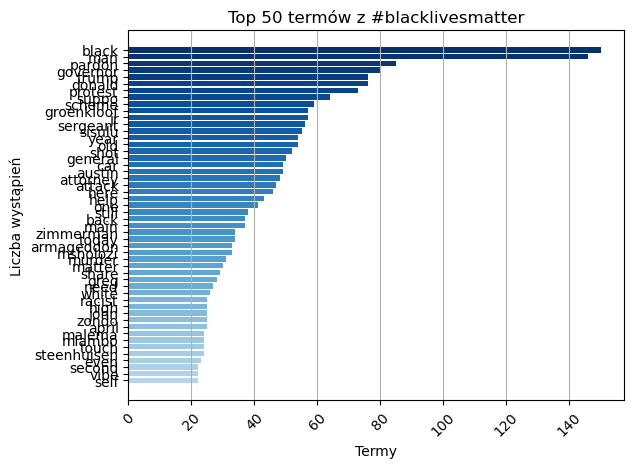

In [260]:
# Wykres dla #blacklivesmatter
words = [word[0] for word in blacklivesmatter_top50][::-1]
counts = [count[1] for count in blacklivesmatter_top50][::-1]
color_range = np.linspace(0.3, 1, len(counts))
colors = plt.cm.Blues(color_range)
plt.barh(words, counts, color = colors)
plt.title('Top 50 termów z #blacklivesmatter')
plt.xlabel('Termy')
plt.ylabel('Liczba wystąpień')
plt.grid(axis = 'x')
plt.xticks(rotation = 45)
plt.savefig('blacklivesmatter_slupkowy.pdf', bbox_inches = 'tight')
plt.show()

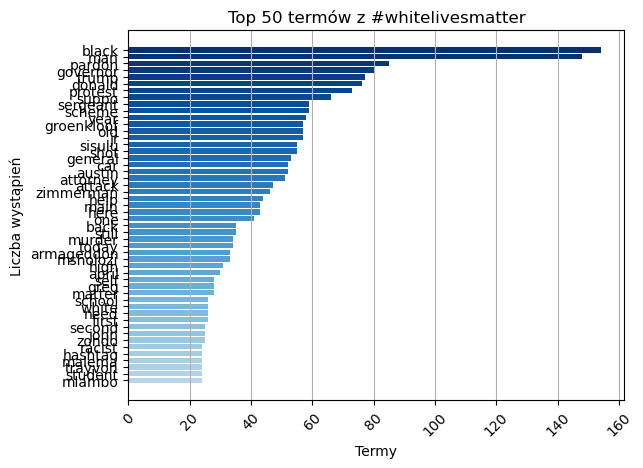

In [261]:
# Wykres dla #whitelivesmatter
words = [word[0] for word in whitelivesmatter_top50][::-1]
counts = [count[1] for count in whitelivesmatter_top50][::-1]
color_range = np.linspace(0.3, 1, len(counts))
colors = plt.cm.Blues(color_range)
plt.barh(words, counts, color = colors)
plt.title('Top 50 termów z #whitelivesmatter')
plt.xlabel('Termy')
plt.ylabel('Liczba wystąpień')
plt.grid(axis = 'x')
plt.xticks(rotation = 45)
plt.savefig('whitelivesmatter_slupkowy.pdf', bbox_inches = 'tight')
plt.show()

In [262]:
## Chmury słów
#1a. Termy #blacklivesmatter
#1b. Termy #whitelivesmatter
#2a. Termy unikalne dla #blacklivesmatter
#2b. Termy unikalne dla #whitelivesmatter
#2c. Termy wspólne dla obu hashtagów

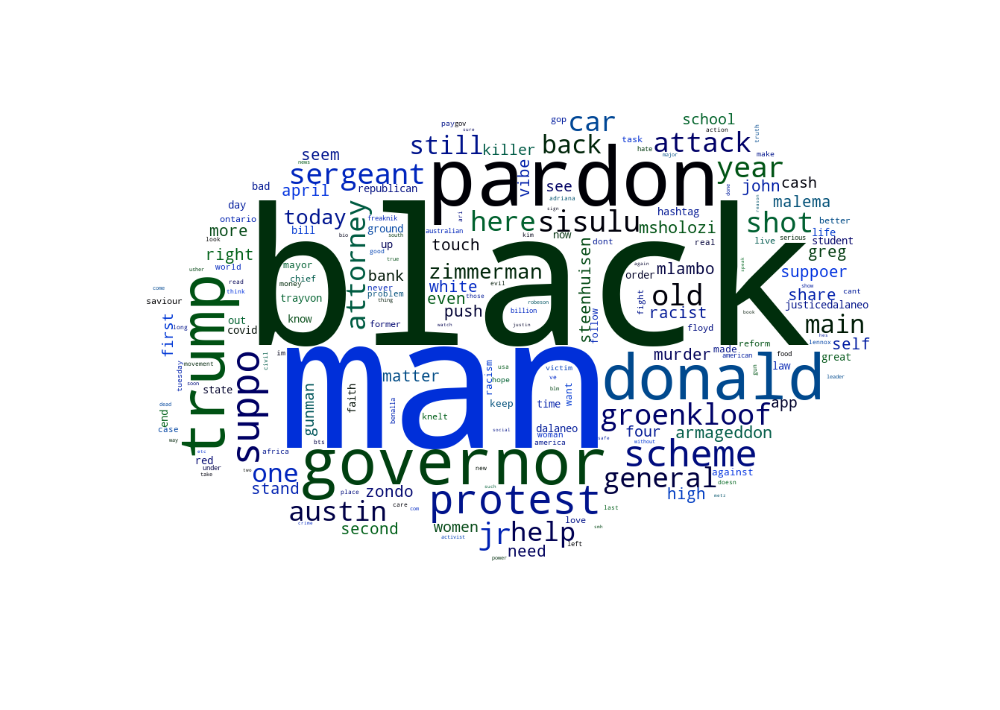

In [263]:
#1a. Termy #blacklivesmatter
blacklivesmatter_wordcloud = {word: freq for word, freq in blacklivesmatter_bow.items()}
cloud_mask = np.array(Image.open("./cloud.png"))
colors = [(0, 0, 0), (0, 0, 0.4), (0, 0.1, 0.6), (0, 0.2, 0.9), (0, 0.4, 0.1), (0, 0, 0)]
cmap = LinearSegmentedColormap.from_list('my_colormap', colors)

wordcloud = WordCloud(width = 900, height = 500, 
                      background_color = 'white', 
                      max_words = 200,
                      mask = cloud_mask, 
                      colormap = cmap,
                      contour_width = 0,
                      contour_color = 'steelblue').generate_from_frequencies(blacklivesmatter_wordcloud)
plt.figure(figsize = (48, 32))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.savefig('blacklivesmatter.pdf')
plt.show()

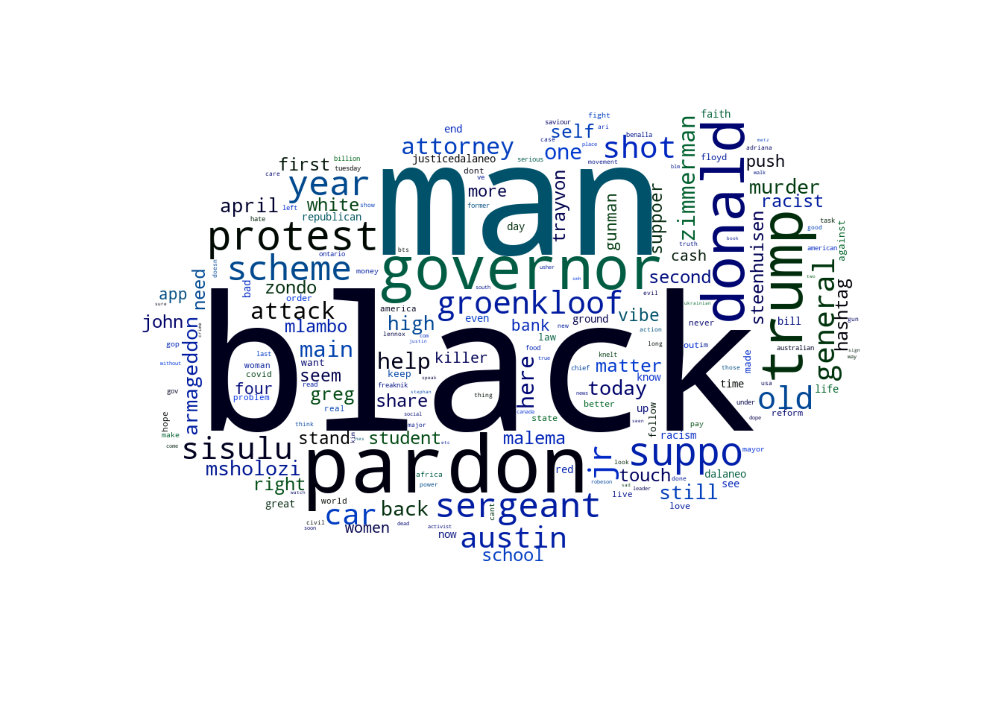

In [264]:
#1b. Termy #whitelivesmatter
whitelivesmatter_wordcloud = {word: freq for word, freq in whitelivesmatter_bow.items()}
cloud_mask = np.array(Image.open("./cloud.png"))
colors = [(0, 0, 0), (0, 0, 0.4), (0, 0.1, 0.6), (0, 0.2, 0.9), (0, 0.4, 0.1), (0, 0, 0)]
cmap = LinearSegmentedColormap.from_list('my_colormap', colors)

wordcloud = WordCloud(width = 900, height = 500, 
                      background_color = 'white', 
                      max_words = 200,
                      mask = cloud_mask, 
                      colormap = cmap,
                      contour_width = 0,
                      contour_color = 'steelblue').generate_from_frequencies(whitelivesmatter_wordcloud)
plt.figure(figsize = (48, 32))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.savefig('whitelivesmatter.pdf')
plt.show()

In [265]:
#2a. Termy unikalne dla #blacklivesmatter
blacklivesmatter_unique = set(whitelivesmatter) - set(blacklivesmatter)
blacklivesmatter_unique = list(blacklivesmatter_unique)
blacklivesmatter_unique_bow = {unique: blacklivesmatter_unique.count(unique) for unique in blacklivesmatter_unique}
#blacklivesmatter_unique_bow

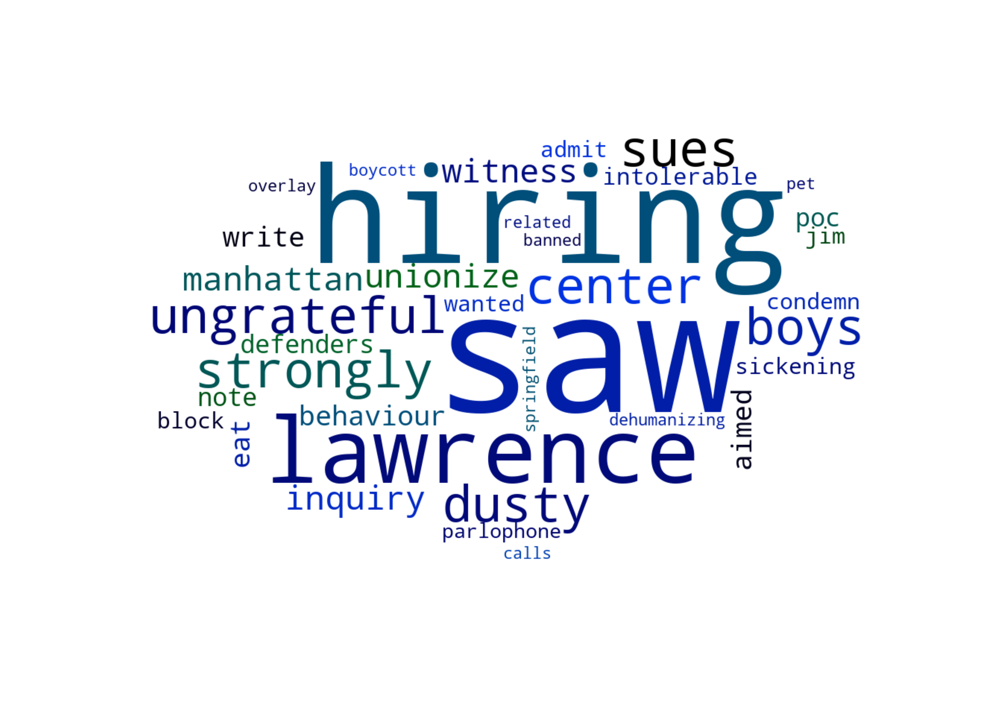

In [266]:
blacklivesmatter_unique_wordcloud = {word: freq for word, freq in blacklivesmatter_unique_bow.items()}
cloud_mask = np.array(Image.open("./cloud.png"))
colors = [(0, 0, 0), (0, 0, 0.4), (0, 0.1, 0.6), (0, 0.2, 0.9), (0, 0.4, 0.1), (0, 0, 0)]
cmap = LinearSegmentedColormap.from_list('my_colormap', colors)
wordcloud = WordCloud(width = 800, height = 400, 
                      background_color = 'white', 
                      max_words = 200,
                      mask = cloud_mask, 
                      colormap = cmap,
                      contour_width = 0,
                      contour_color = 'steelblue').generate_from_frequencies(blacklivesmatter_unique_wordcloud)
plt.figure(figsize = (48, 32))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.savefig('blacklivesmatter_unique.pdf')
plt.show()

In [267]:
#2b. Termy unikalne dla #whitelivesmatter
whitelivesmatter_unique = set(blacklivesmatter) - set(whitelivesmatter)
whitelivesmatter_unique = list(whitelivesmatter_unique)
whitelivesmatter_unique_bow = {unique: whitelivesmatter_unique.count(unique) for unique in whitelivesmatter_unique}
#whitelivesmatter_unique_bow

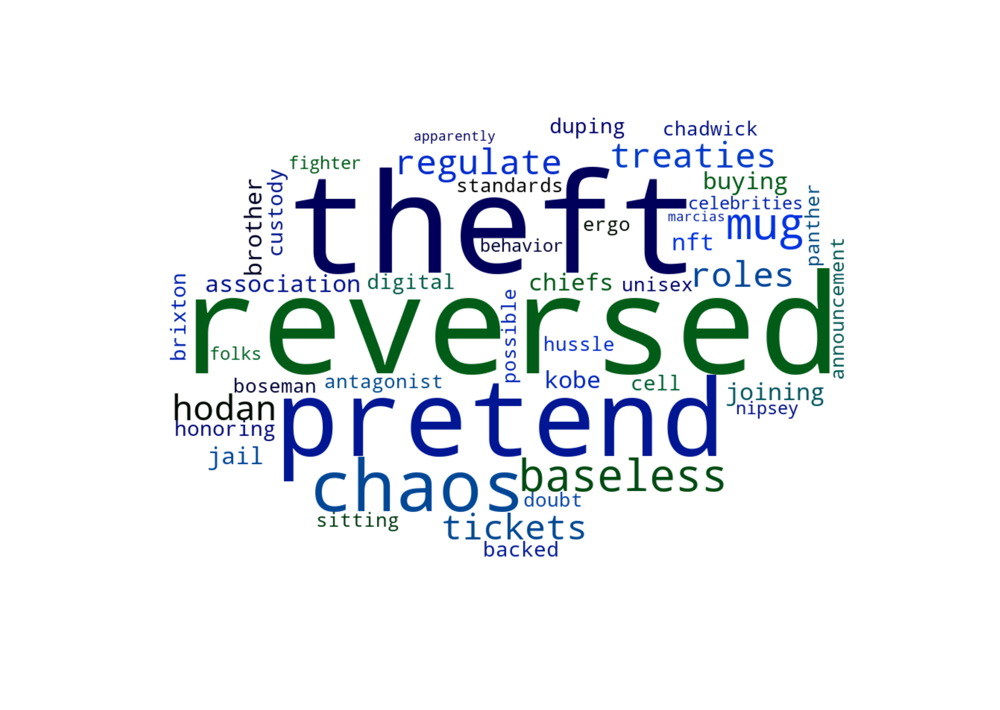

In [268]:
whitelivesmatter_unique_wordcloud = {word: freq for word, freq in whitelivesmatter_unique_bow.items()}
cloud_mask = np.array(Image.open("./cloud.png"))
colors = [(0, 0, 0), (0, 0, 0.4), (0, 0.1, 0.6), (0, 0.2, 0.9), (0, 0.4, 0.1), (0, 0, 0)]
cmap = LinearSegmentedColormap.from_list('my_colormap', colors)
wordcloud = WordCloud(width = 800, height = 400, 
                      background_color = 'white', 
                      max_words = 200,
                      mask = cloud_mask, 
                      colormap = cmap,
                      contour_width = 0,
                      contour_color = 'steelblue').generate_from_frequencies(whitelivesmatter_unique_wordcloud)
plt.figure(figsize = (48, 32))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.savefig('whitelivesmatter_unique.pdf')
plt.show()

In [269]:
#2c. Termy wspólne dla obu hashtagów
blacklivesmatter_whitelivesmatter = set(whitelivesmatter) & set(blacklivesmatter)
blacklivesmatter_whitelivesmatter = list(blacklivesmatter_whitelivesmatter)
blacklivesmatter_whitelivesmatter_bow = {unique: blacklivesmatter_whitelivesmatter.count(unique) for unique in blacklivesmatter_whitelivesmatter}
#blacklivesmatter_whitelivesmatter_bow

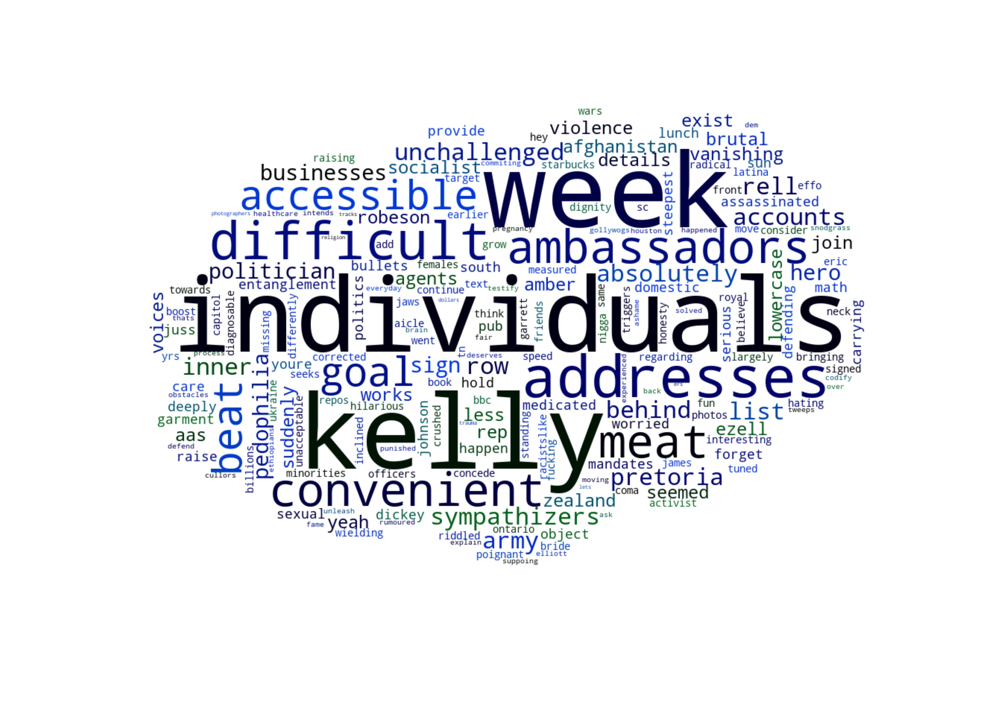

In [270]:
blacklivesmatter_whitelivesmatter_wordcloud = {word: freq for word, freq in blacklivesmatter_whitelivesmatter_bow.items()}
cloud_mask = np.array(Image.open("./cloud.png"))
colors = [(0, 0, 0), (0, 0, 0.4), (0, 0.1, 0.6), (0, 0.2, 0.9), (0, 0.4, 0.1), (0, 0, 0)]
cmap = LinearSegmentedColormap.from_list('my_colormap', colors)
wordcloud = WordCloud(width = 800, height = 400, 
                      background_color = 'white', 
                      max_words = 200,
                      mask = cloud_mask, 
                      colormap = cmap,
                      contour_width = 0,
                      contour_color = 'steelblue').generate_from_frequencies(blacklivesmatter_whitelivesmatter_wordcloud)
plt.figure(figsize = (48, 32))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.savefig('blacklivesmatter_whitelivesmatter.pdf')
plt.show()